In [1]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import LabelEncoder
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as pe
plt.rcParams['figure.figsize'] = (8, 5)
plt.rcParams['figure.dpi'] = 250
%matplotlib inline
import warnings
warnings.filterwarnings(action= 'ignore')

In [2]:
df = pd.read_csv(r"C:\Users\hp\Desktop\Class data\data\EastWestAirlines.csv", index_col=0)
# pd.set_option('display.max_rows',None)
df

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?
ID#,,,,,,,,,,,
1,28143,0,1,1,1,174,1,0,0,7000,0
2,19244,0,1,1,1,215,2,0,0,6968,0
3,41354,0,1,1,1,4123,4,0,0,7034,0
4,14776,0,1,1,1,500,1,0,0,6952,0
5,97752,0,4,1,1,43300,26,2077,4,6935,1
...,...,...,...,...,...,...,...,...,...,...,...
4017,18476,0,1,1,1,8525,4,200,1,1403,1
4018,64385,0,1,1,1,981,5,0,0,1395,1
4019,73597,0,3,1,1,25447,8,0,0,1402,1


In [3]:
df.describe()

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?
count,3.999000e+03,3999.000000,3999.000000,3999.000000,3999.000000,3999.000000,3999.00000,3999.000000,3999.000000,3999.00000,3999.000000
mean,7.360133e+04,144.114529,2.059515,1.014504,1.012253,17144.846212,11.60190,460.055764,1.373593,4118.55939,0.370343
std,1.007757e+05,773.663804,1.376919,0.147650,0.195241,24150.967826,9.60381,1400.209171,3.793172,2065.13454,0.482957
min,0.000000e+00,0.000000,1.000000,1.000000,1.000000,0.000000,0.00000,0.000000,0.000000,2.00000,0.000000
25%,1.852750e+04,0.000000,1.000000,1.000000,1.000000,1250.000000,3.00000,0.000000,0.000000,2330.00000,0.000000
50%,4.309700e+04,0.000000,1.000000,1.000000,1.000000,7171.000000,12.00000,0.000000,0.000000,4096.00000,0.000000
75%,9.240400e+04,0.000000,3.000000,1.000000,1.000000,23800.500000,17.00000,311.000000,1.000000,5790.50000,1.000000
max,1.704838e+06,11148.000000,5.000000,3.000000,5.000000,263685.000000,86.00000,30817.000000,53.000000,8296.00000,1.000000


In [4]:
df.info()              

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3999 entries, 1 to 4021
Data columns (total 11 columns):
 #   Column             Non-Null Count  Dtype
---  ------             --------------  -----
 0   Balance            3999 non-null   int64
 1   Qual_miles         3999 non-null   int64
 2   cc1_miles          3999 non-null   int64
 3   cc2_miles          3999 non-null   int64
 4   cc3_miles          3999 non-null   int64
 5   Bonus_miles        3999 non-null   int64
 6   Bonus_trans        3999 non-null   int64
 7   Flight_miles_12mo  3999 non-null   int64
 8   Flight_trans_12    3999 non-null   int64
 9   Days_since_enroll  3999 non-null   int64
 10  Award?             3999 non-null   int64
dtypes: int64(11)
memory usage: 374.9 KB


In [5]:
df.isna().sum()          # No missing values

Balance              0
Qual_miles           0
cc1_miles            0
cc2_miles            0
cc3_miles            0
Bonus_miles          0
Bonus_trans          0
Flight_miles_12mo    0
Flight_trans_12      0
Days_since_enroll    0
Award?               0
dtype: int64

In [6]:
df.duplicated().sum()

1

In [7]:
df[df.duplicated(keep=False)]

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?
ID#,,,,,,,,,,,
3393,1000,0,1,1,1,0,0,0,0,1597,0
3899,1000,0,1,1,1,0,0,0,0,1597,0


In [8]:
df.drop_duplicates(inplace=True)
df.duplicated().sum()

0

In [9]:
pe.box(df['Qual_miles'])

In [10]:
df['Qual_miles'].nunique()

164

In [11]:
df['Qual_miles'].value_counts()

0       3772
1000      17
500       15
967        4
888        4
        ... 
4116       1
1388       1
1896       1
3692       1
1005       1
Name: Qual_miles, Length: 164, dtype: int64

<Axes: xlabel='Qual_miles', ylabel='Density'>

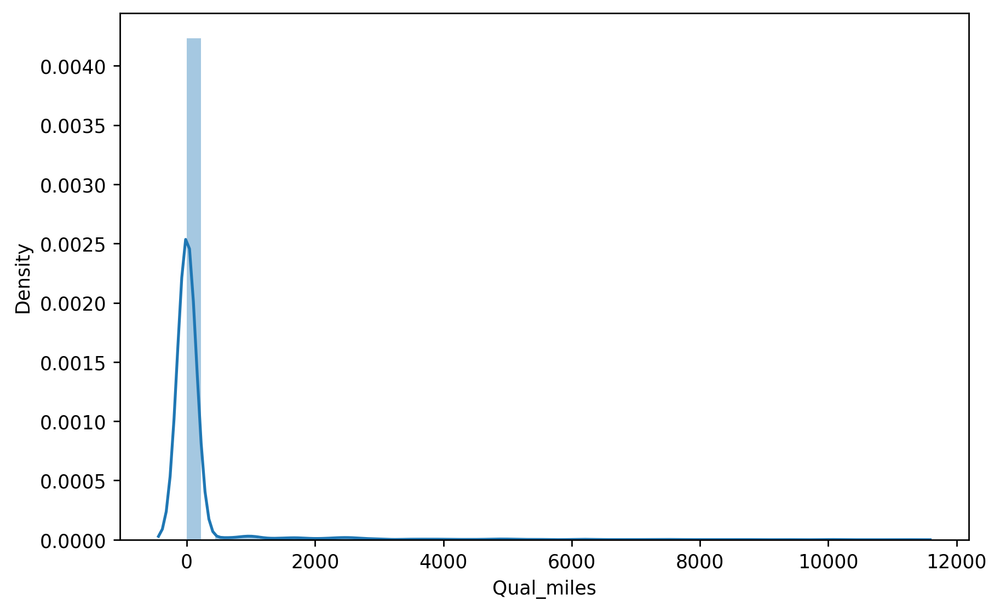

In [12]:
sns.distplot(df['Qual_miles'])

In [13]:
# In Qual_miles column single value i.e. '0' is overwhelmingly dominant with 3773 out of 3999 data points.
# rest of the values contribute very less to the data, and might add noise to our model
# Capping method to remove outliers will bring variance of this column to zero.
# and log transformation will not work because log of zero is invalid and majority of our values counts is zero.
# Considering all these points we will drop this column from our dataset

In [14]:
df.drop(columns='Qual_miles',inplace=True)

In [15]:
df[['cc1_miles', 'cc2_miles', 'cc3_miles']].nunique()

cc1_miles    5
cc2_miles    3
cc3_miles    5
dtype: int64

In [16]:
df['cc1_miles'].value_counts()

1    2288
3     613
4     525
5     288
2     284
Name: cc1_miles, dtype: int64

In [17]:
df['cc2_miles'].value_counts()

1    3955
2      28
3      15
Name: cc2_miles, dtype: int64

In [18]:
df['cc3_miles'].value_counts()

1    3980
4       6
5       5
3       4
2       3
Name: cc3_miles, dtype: int64

In [19]:
# Similar to qual_miles column, log transformation and capping method will reduce variance of cc1, cc2 & cc3 miles
# Binning of columns cc2, and cc3

In [20]:
df['cc3_miles_binned'] = df['cc3_miles'].apply(lambda x: '2+' if x > 1 else '1')
df['cc2_miles_binned'] = df['cc2_miles'].apply(lambda x: '2+' if x > 1 else '1')

In [21]:
df.drop(columns='cc3_miles',inplace=True)
df.drop(columns='cc2_miles',inplace=True)
df

,Balance,cc1_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?,cc3_miles_binned,cc2_miles_binned
ID#,,,,,,,,,,
1,28143,1,174,1,0,0,7000,0,1,1
2,19244,1,215,2,0,0,6968,0,1,1
3,41354,1,4123,4,0,0,7034,0,1,1
4,14776,1,500,1,0,0,6952,0,1,1
5,97752,4,43300,26,2077,4,6935,1,1,1
...,...,...,...,...,...,...,...,...,...,...
4017,18476,1,8525,4,200,1,1403,1,1,1
4018,64385,1,981,5,0,0,1395,1,1,1
4019,73597,3,25447,8,0,0,1402,1,1,1


In [22]:
x = pd.get_dummies(df, columns=['Award?','cc3_miles_binned','cc2_miles_binned'],drop_first=True)
x

,Balance,cc1_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?_1,cc3_miles_binned_2+,cc2_miles_binned_2+
ID#,,,,,,,,,,
1,28143,1,174,1,0,0,7000,0,0,0
2,19244,1,215,2,0,0,6968,0,0,0
3,41354,1,4123,4,0,0,7034,0,0,0
4,14776,1,500,1,0,0,6952,0,0,0
5,97752,4,43300,26,2077,4,6935,1,0,0
...,...,...,...,...,...,...,...,...,...,...
4017,18476,1,8525,4,200,1,1403,1,0,0
4018,64385,1,981,5,0,0,1395,1,0,0
4019,73597,3,25447,8,0,0,1402,1,0,0


In [23]:
x.columns

Index(['Balance', 'cc1_miles', 'Bonus_miles', 'Bonus_trans',
       'Flight_miles_12mo', 'Flight_trans_12', 'Days_since_enroll', 'Award?_1',
       'cc3_miles_binned_2+', 'cc2_miles_binned_2+'],
      dtype='object')

In [24]:
x = x[['Balance', 'cc1_miles','cc2_miles_binned_2+','cc3_miles_binned_2+','Bonus_miles', 'Bonus_trans',
       'Flight_miles_12mo', 'Flight_trans_12', 'Days_since_enroll', 'Award?_1']]
x

,Balance,cc1_miles,cc2_miles_binned_2+,cc3_miles_binned_2+,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?_1
ID#,,,,,,,,,,
1,28143,1,0,0,174,1,0,0,7000,0
2,19244,1,0,0,215,2,0,0,6968,0
3,41354,1,0,0,4123,4,0,0,7034,0
4,14776,1,0,0,500,1,0,0,6952,0
5,97752,4,0,0,43300,26,2077,4,6935,1
...,...,...,...,...,...,...,...,...,...,...
4017,18476,1,0,0,8525,4,200,1,1403,1
4018,64385,1,0,0,981,5,0,0,1395,1
4019,73597,3,0,0,25447,8,0,0,1402,1


In [25]:
pe.box(x, orientation='h')

In [26]:
x[['Balance','Bonus_miles','Bonus_trans','Flight_miles_12mo','Flight_trans_12','Days_since_enroll']].nunique()

Balance              3904
Bonus_miles          2734
Bonus_trans            57
Flight_miles_12mo     343
Flight_trans_12        35
Days_since_enroll    2820
dtype: int64

In [27]:
x['Flight_trans_12'].unique()

array([ 0,  4,  1, 12,  3,  2,  9, 11,  5,  7, 29,  8, 16, 10, 14,  6, 23,
       17, 18, 13, 15, 25, 28, 20, 26, 27, 19, 36, 45, 24, 31, 21, 53, 22,
       46], dtype=int64)

In [28]:
x['Flight_miles_12mo'].value_counts()

0        2722
500       195
1000       53
150        51
100        49
         ... 
12400       1
2729        1
4309        1
683         1
79          1
Name: Flight_miles_12mo, Length: 343, dtype: int64

<Axes: xlabel='Flight_trans_12', ylabel='Density'>

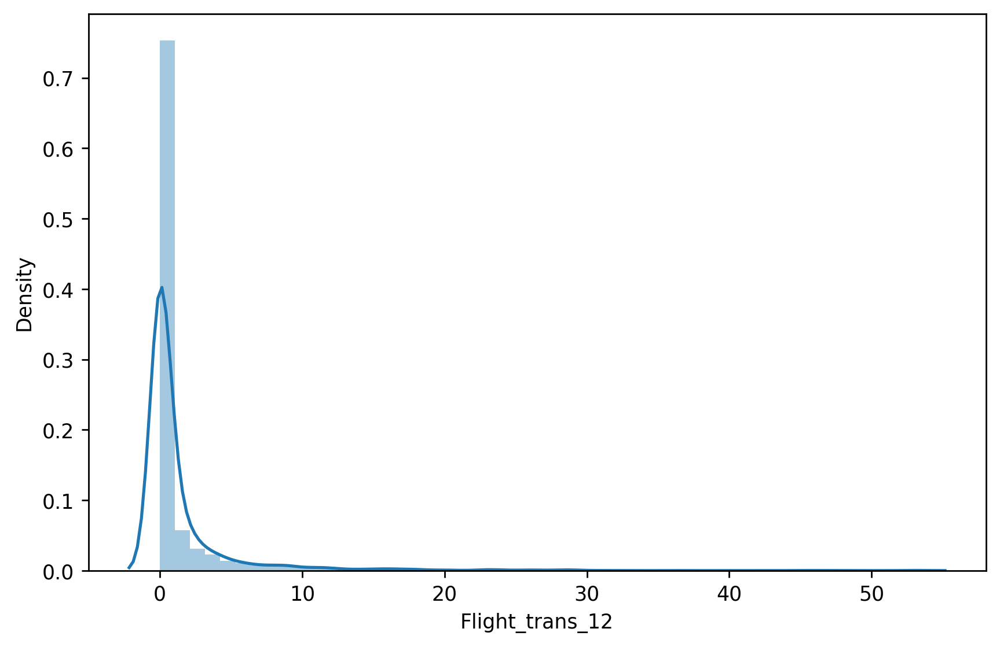

In [29]:
sns.distplot(x['Flight_trans_12'])

In [30]:
x['Days_since_enroll'].value_counts()

8296    38
8289    33
8228    15
7467     7
4791     7
        ..
4770     1
4672     1
4615     1
4566     1
1398     1
Name: Days_since_enroll, Length: 2820, dtype: int64

### Outliers & Standardization

In [31]:
x.columns

Index(['Balance', 'cc1_miles', 'cc2_miles_binned_2+', 'cc3_miles_binned_2+',
       'Bonus_miles', 'Bonus_trans', 'Flight_miles_12mo', 'Flight_trans_12',
       'Days_since_enroll', 'Award?_1'],
      dtype='object')

In [32]:
pe.box(x, orientation='h')

In [33]:
x.describe()

,Balance,cc1_miles,cc2_miles_binned_2+,cc3_miles_binned_2+,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?_1
count,3.998000e+03,3998.00000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000
mean,7.361949e+04,2.05978,0.010755,0.004502,17149.134567,11.604802,460.170835,1.373937,4119.190095,0.370435
std,1.007817e+05,1.37699,0.103162,0.066956,24152.465996,9.603258,1400.365407,3.793585,2065.007629,0.482982
min,0.000000e+00,1.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000
25%,1.853425e+04,1.00000,0.000000,0.000000,1250.000000,3.000000,0.000000,0.000000,2331.250000,0.000000
50%,4.313800e+04,1.00000,0.000000,0.000000,7183.000000,12.000000,0.000000,0.000000,4097.500000,0.000000
75%,9.240500e+04,3.00000,0.000000,0.000000,23810.750000,17.000000,313.500000,1.000000,5790.750000,1.000000
max,1.704838e+06,5.00000,1.000000,1.000000,263685.000000,86.000000,30817.000000,53.000000,8296.000000,1.000000


In [34]:
from sklearn.preprocessing import StandardScaler

In [35]:
scaler = StandardScaler()
dfs = scaler.fit_transform(x)

In [36]:
dfs

array([[-4.51293870e-01, -7.69731660e-01, -1.04270387e-01, ...,
        -3.62219103e-01,  1.39523468e+00, -7.67071631e-01],
       [-5.39604653e-01, -7.69731660e-01, -1.04270387e-01, ...,
        -3.62219103e-01,  1.37973643e+00, -7.67071631e-01],
       [-3.20192202e-01, -7.69731660e-01, -1.04270387e-01, ...,
        -3.62219103e-01,  1.41170157e+00, -7.67071631e-01],
       ...,
       [-2.23153612e-04,  6.82893866e-01, -1.04270387e-01, ...,
        -3.62219103e-01, -1.31599028e+00,  1.30365921e+00],
       [-1.85776026e-01, -7.69731660e-01, -1.04270387e-01, ...,
        -9.85832074e-02, -1.31647460e+00, -7.67071631e-01],
       [-7.00646048e-01, -7.69731660e-01, -1.04270387e-01, ...,
        -3.62219103e-01, -1.31792757e+00, -7.67071631e-01]])

In [37]:
dfs = pd.DataFrame(dfs, columns=x.columns)
dfs

,Balance,cc1_miles,cc2_miles_binned_2+,cc3_miles_binned_2+,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?_1
0,-0.451294,-0.769732,-0.10427,-0.06725,-0.702920,-1.104430,-0.328649,-0.362219,1.395235,-0.767072
1,-0.539605,-0.769732,-0.10427,-0.06725,-0.701223,-1.000286,-0.328649,-0.362219,1.379736,-0.767072
2,-0.320192,-0.769732,-0.10427,-0.06725,-0.539397,-0.791997,-0.328649,-0.362219,1.411702,-0.767072
3,-0.583944,-0.769732,-0.10427,-0.06725,-0.689421,-1.104430,-0.328649,-0.362219,1.371987,-0.767072
4,0.239483,1.409207,-0.10427,-0.06725,1.082876,1.499179,1.154721,0.692324,1.363754,1.303659
...,...,...,...,...,...,...,...,...,...,...
3993,-0.547226,-0.769732,-0.10427,-0.06725,-0.357115,-0.791997,-0.185811,-0.098583,-1.315506,1.303659
3994,-0.091640,-0.769732,-0.10427,-0.06725,-0.669503,-0.687853,-0.328649,-0.362219,-1.319381,1.303659
3995,-0.000223,0.682894,-0.10427,-0.06725,0.343605,-0.375420,-0.328649,-0.362219,-1.315990,1.303659
3996,-0.185776,-0.769732,-0.10427,-0.06725,-0.689421,-1.104430,0.028446,-0.098583,-1.316475,-0.767072


In [38]:
pe.box(dfs, orientation='h')

<Axes: >

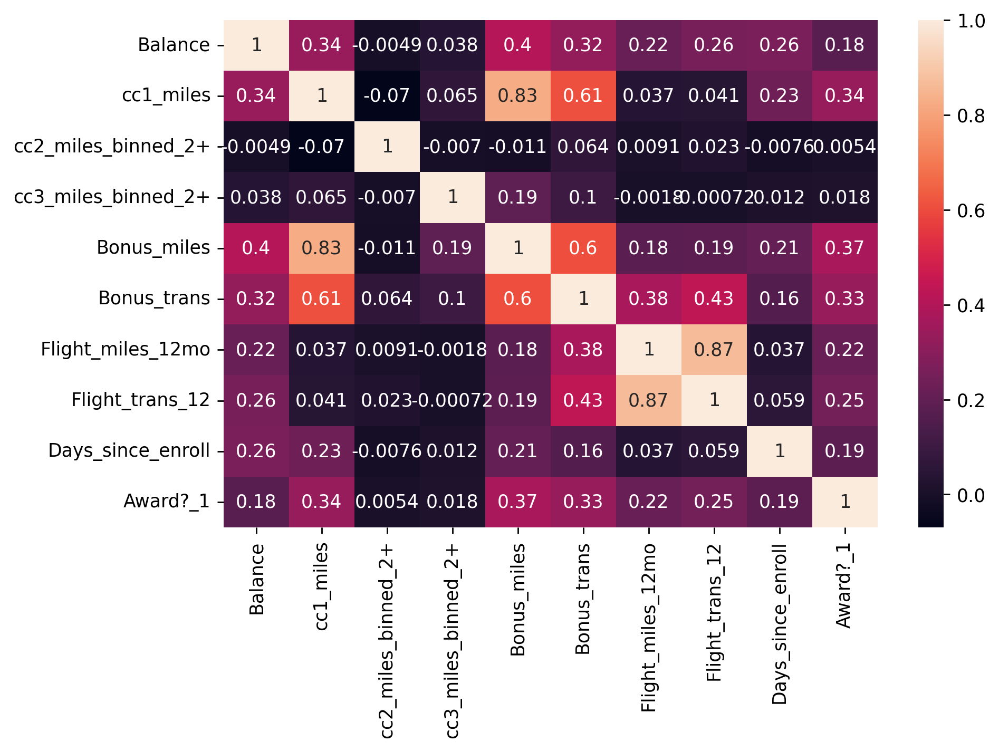

In [39]:
sns.heatmap(dfs.corr(),annot=True)

In [40]:
# Insights:-

#High Positive Correlations:

# Bonus_miles and cc1_miles (0.83): Strong positive correlation suggests that 
    # customers who earn more miles with the frequent flyer credit card also tend to earn more bonus miles.


# Flight_miles_12mo and Flight_trans_12 (0.87): Strong positive correlation indicates that 
    # customers who have more flight miles in the past year also have more flight transactions.


# Bonus_trans and cc1_miles (0.61): Customers with more non-flight bonus transactions also tend to earn more miles 
    # with the frequent flyer credit card.
    
# Bonus_trans and Bonus_miles(0.6): Their is also positive correlation suggesting that customers with more number of 
    # non flight transactions have more bonus miles earned from those non flight transactions.

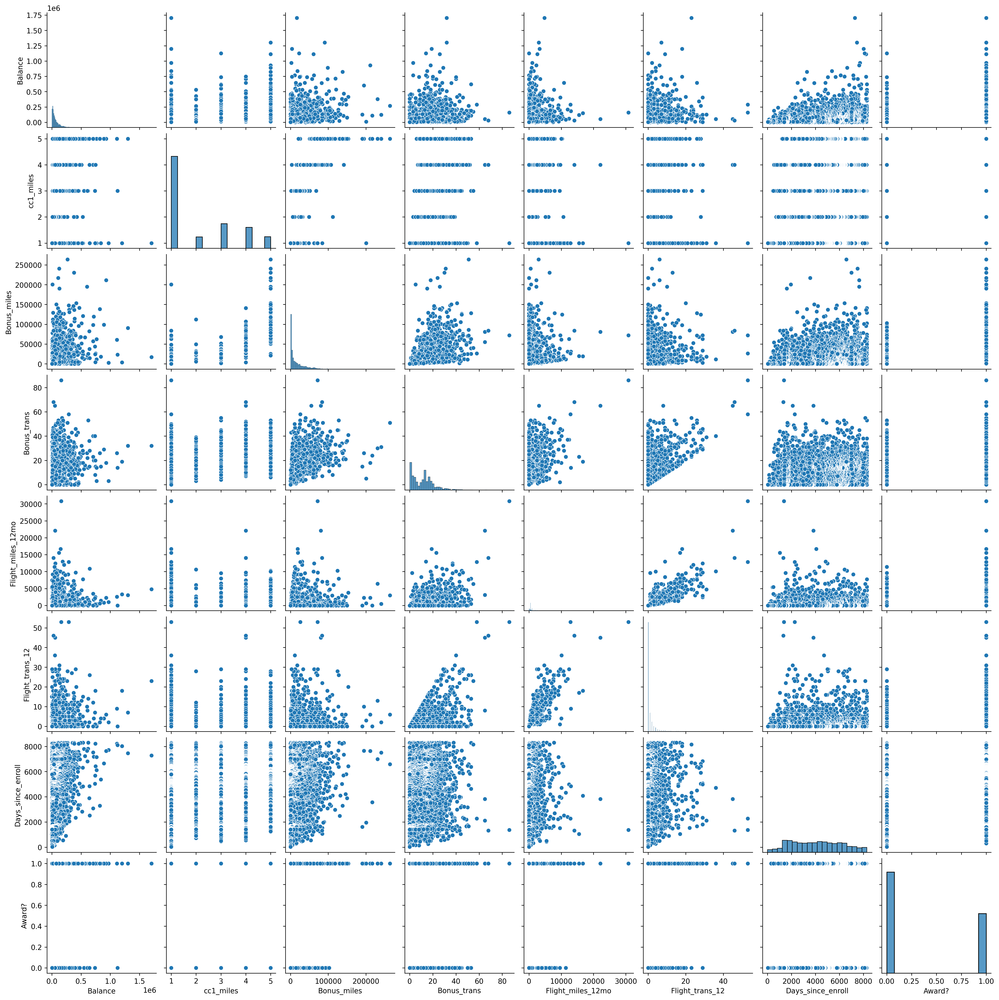

In [41]:
sns.pairplot(df)

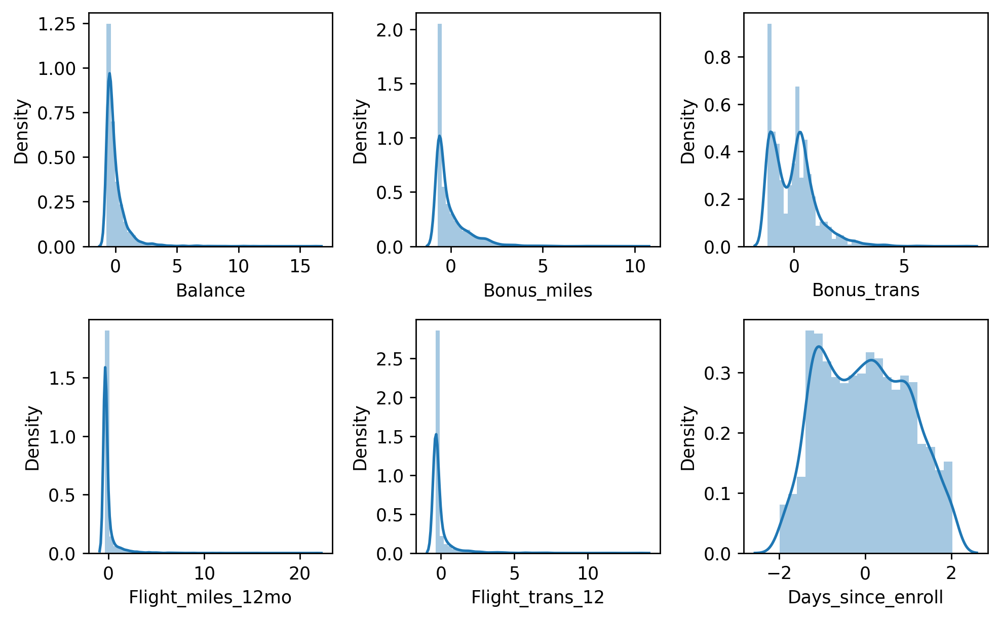

In [42]:
plt.subplot(2,3,1)
sns.distplot(dfs['Balance'])

plt.subplot(2,3,2)
sns.distplot(dfs['Bonus_miles'])

plt.subplot(2,3,3)
sns.distplot(dfs['Bonus_trans'])

plt.subplot(2,3,4)
sns.distplot(dfs['Flight_miles_12mo'])

plt.subplot(2,3,5)
sns.distplot(dfs['Flight_trans_12'])

plt.subplot(2,3,6)
sns.distplot(dfs['Days_since_enroll'])

plt.tight_layout()

## Model Building

### 1.Hierarchical Clustering

In [43]:
from scipy.cluster import hierarchy

#### Single Linkage Method

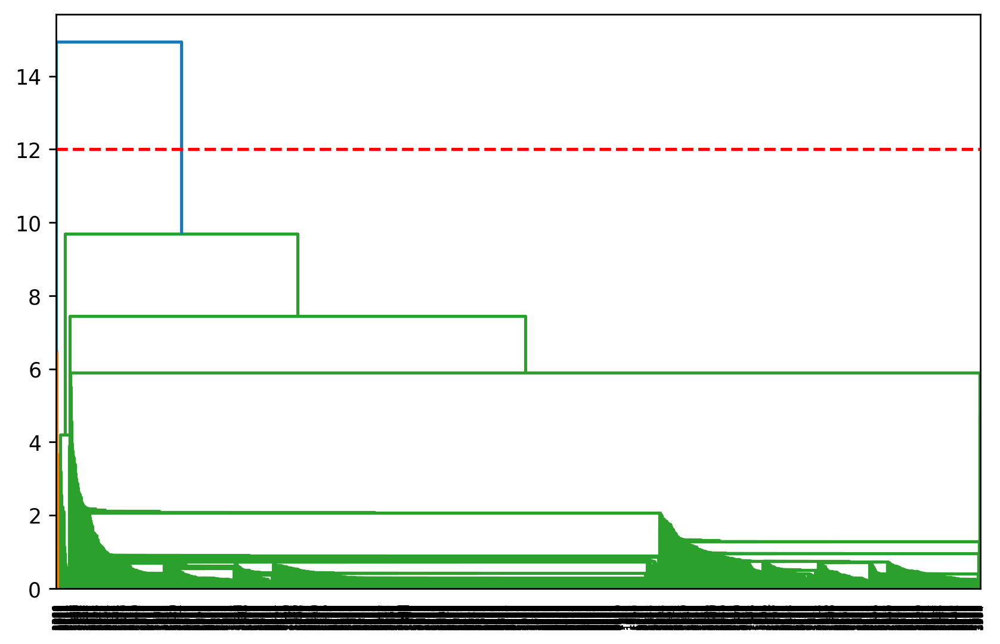

In [44]:
lk = hierarchy.linkage(dfs, method='single')
dendrogram = hierarchy.dendrogram(lk)
plt.axhline(y = 12, linestyle = '--', color = 'red')

#### Complete Linkage Method

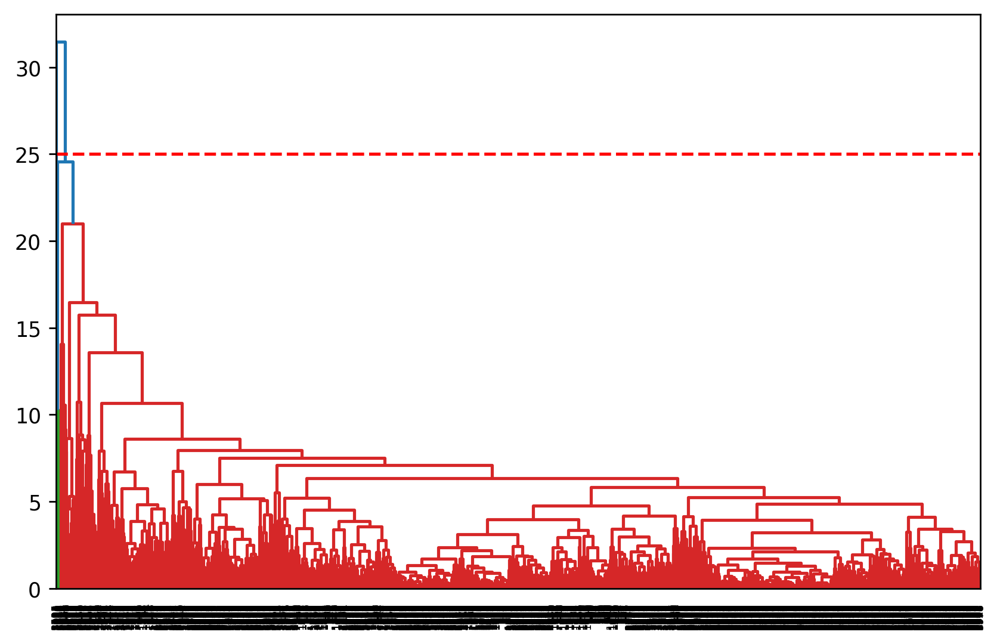

In [45]:
lk1 = hierarchy.linkage(dfs, method='complete')
dendrogram1 = hierarchy.dendrogram(lk1)
plt.axhline(y = 25, linestyle = '--', color = 'red')

In [46]:
from sklearn.cluster import AgglomerativeClustering

In [47]:
hc = AgglomerativeClustering(n_clusters=2)
y_pred = hc.fit_predict(dfs)
y_pred

array([1, 1, 1, ..., 0, 1, 1], dtype=int64)

In [48]:
len((y_pred))

3998

In [49]:
df['Cluster'] = y_pred
df

,Balance,cc1_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?,cc3_miles_binned,cc2_miles_binned,Cluster
ID#,,,,,,,,,,,
1,28143,1,174,1,0,0,7000,0,1,1,1
2,19244,1,215,2,0,0,6968,0,1,1,1
3,41354,1,4123,4,0,0,7034,0,1,1,1
4,14776,1,500,1,0,0,6952,0,1,1,1
5,97752,4,43300,26,2077,4,6935,1,1,1,0
...,...,...,...,...,...,...,...,...,...,...,...
4017,18476,1,8525,4,200,1,1403,1,1,1,1
4018,64385,1,981,5,0,0,1395,1,1,1,1
4019,73597,3,25447,8,0,0,1402,1,1,1,0


In [50]:
df.groupby(df['Cluster']).agg('mean')

,Balance,cc1_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?
Cluster,,,,,,,,
0,111151.715265,3.516511,36720.394393,18.940187,649.077259,1.912773,4516.732087,0.574455
1,48446.387798,1.082741,4022.568742,6.684914,333.470121,1.012537,3852.556206,0.233598


In [51]:
# our model has grouped into 2 categories one with less miles,balance and transactions and vice versa
# 1 cluster is group of people with less balance, who earned less miles with credit card and also has low transactions
# 0th cluster are people with higher balance, miles and also who had enrolled earlier than other group of people

<Axes: xlabel='Balance', ylabel='Bonus_miles'>

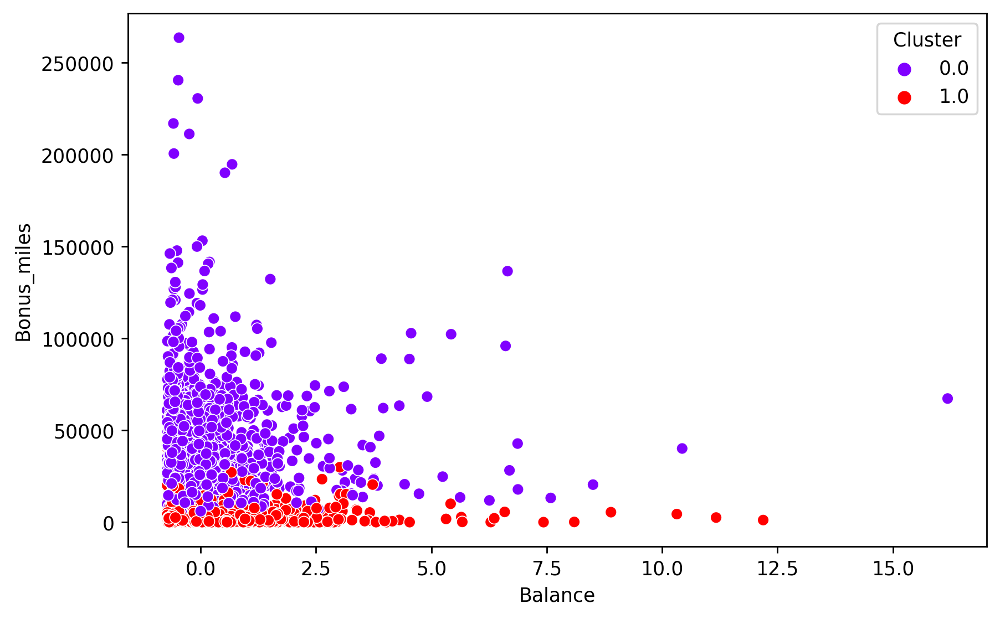

In [52]:
sns.scatterplot(x = dfs['Balance'],y = df['Bonus_miles'], hue=df['Cluster'],palette='rainbow')

### 2.K-Means

In [53]:
from sklearn.cluster import KMeans

In [54]:
km = KMeans()

In [55]:
y = km.fit_predict(dfs)

In [56]:
len(y)

3998

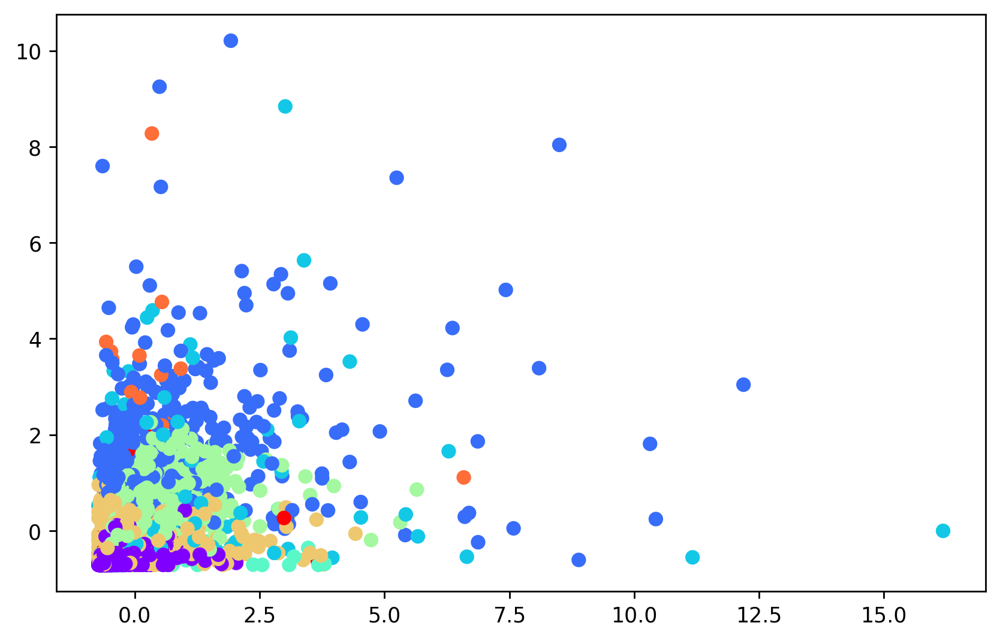

In [57]:
plt.scatter(x = dfs['Balance'],y = dfs['Bonus_miles'],c = y, cmap='rainbow')

### Elbow Graph

In [58]:
wcss = []

for i in range(1,11):
    km = KMeans(n_clusters=i)
    km.fit_predict(dfs)
    wcss.append(km.inertia_)

In [59]:
wcss

[39980.000000000015,
 31430.83615218486,
 26993.61395646677,
 22954.859743965124,
 19054.733643124833,
 17109.43666298561,
 15231.95032304772,
 13863.323006752618,
 12624.81944104813,
 11588.315233886622]

Text(0.5, 1.0, 'Elbow Graph')

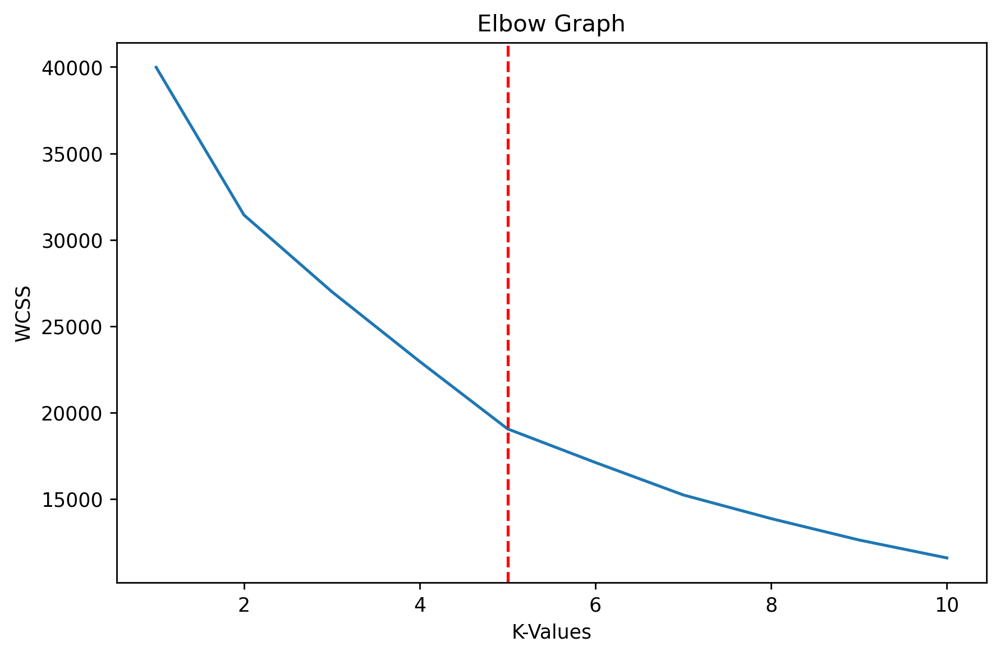

In [60]:
plt.plot(range(1,11),wcss)
plt.axvline(x = 5, linestyle = '--', color = 'red')
plt.xlabel('K-Values')
plt.ylabel('WCSS')
plt.title('Elbow Graph')

In [61]:
km = KMeans(n_clusters=5)
ypred = km.fit_predict(dfs)
ypred

array([0, 0, 0, ..., 1, 0, 0])

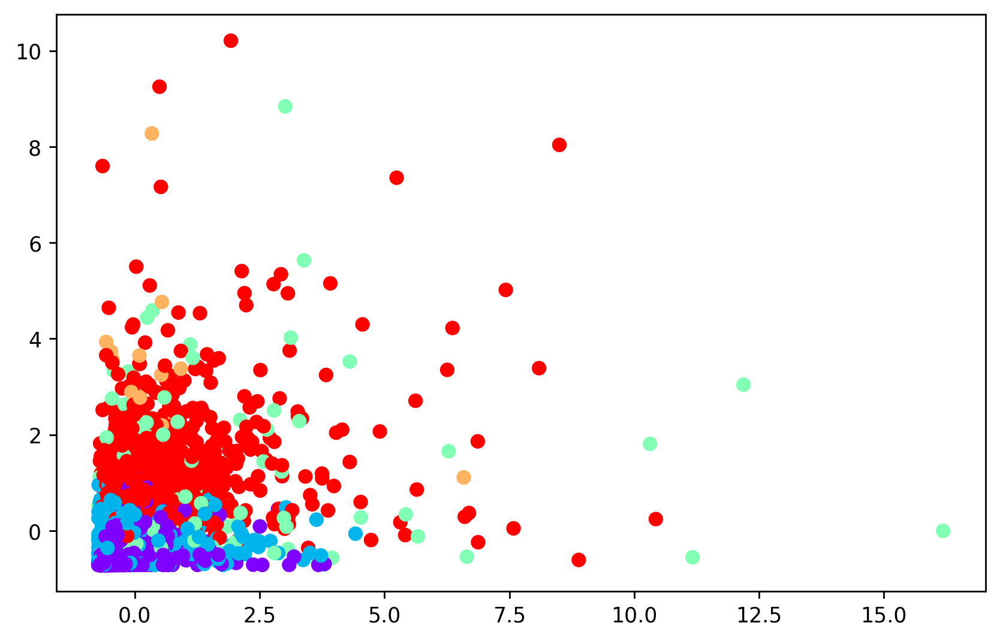

In [62]:
plt.scatter(x = dfs['Balance'],y = dfs['Bonus_miles'],c = ypred, cmap='rainbow')

In [63]:
from sklearn.metrics import silhouette_score
silhouette_score(dfs,ypred)

0.2800554457070421

## 3.DBSCAN

In [64]:
from sklearn.cluster import DBSCAN

In [65]:
db = DBSCAN(eps=0.5, min_samples=5)

y2 = db.fit_predict(dfs)

In [66]:
y2

array([0, 0, 0, ..., 6, 0, 0], dtype=int64)

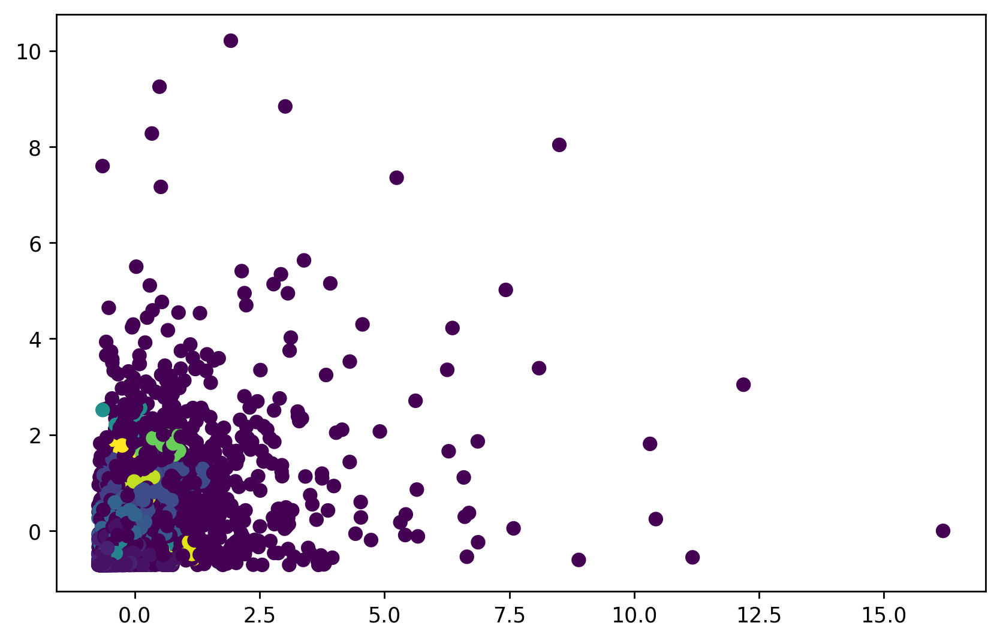

In [67]:
plt.scatter(x = dfs['Balance'],y = dfs['Bonus_miles'],c = y2, cmap='viridis')

In [68]:
from sklearn.neighbors import NearestNeighbors
neigh = NearestNeighbors(n_neighbors=3).fit(dfs)
d,i = neigh.kneighbors(dfs)
pd.DataFrame(d)

,0,1,2
0,0.0,0.111852,0.120336
1,0.0,0.114067,0.114382
2,0.0,0.165401,0.194584
3,0.0,0.048377,0.058576
4,0.0,0.545494,0.735073
...,...,...,...
3993,0.0,0.288927,0.335125
3994,0.0,0.232717,0.312813
3995,0.0,0.166144,0.280241
3996,0.0,0.257255,0.271660


Text(0, 0.5, 'Epsilon value')

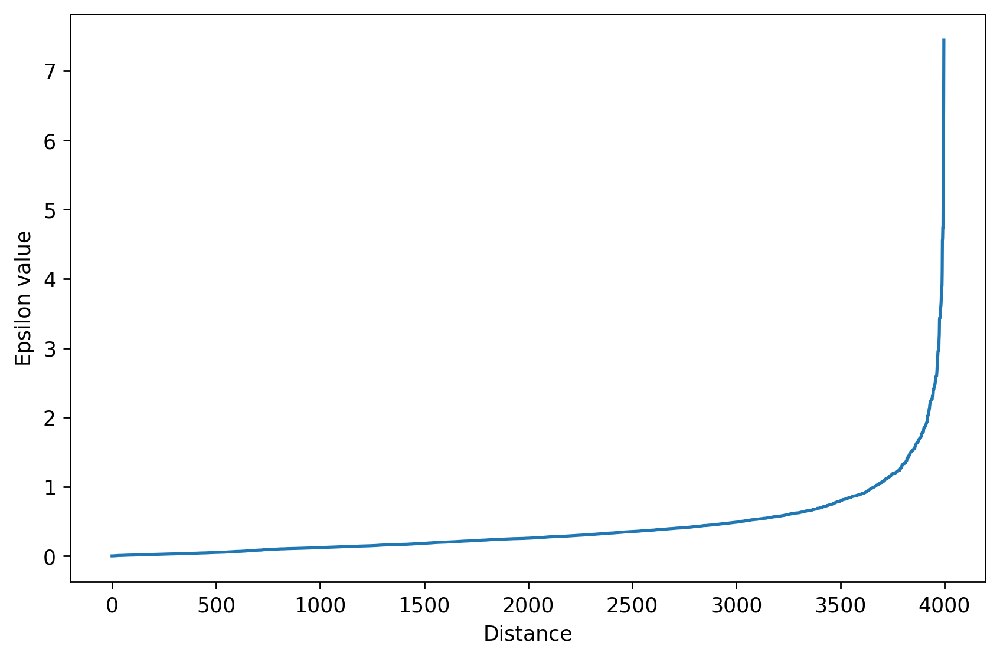

In [69]:
dist = np.sort(d[:,1])
plt.plot(dist)
plt.xlabel('Distance')
plt.ylabel('Epsilon value')

In [70]:
db = DBSCAN(eps=2,min_samples=3)
y1pred = db.fit_predict(dfs)
y1pred

array([0, 0, 0, ..., 1, 0, 0], dtype=int64)

In [71]:
silhouette_score(dfs,y1pred)

0.26454456793679215